# Semantic Segmentation


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
Among the all computer vision tasks the most popular are: <ul>
    <li> Classification.
    <li> Object Detection.
    <li> Semantic Segmentation.
    <li> Instance Segmentation.


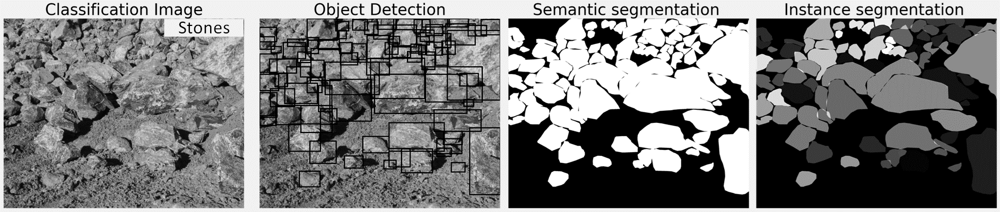

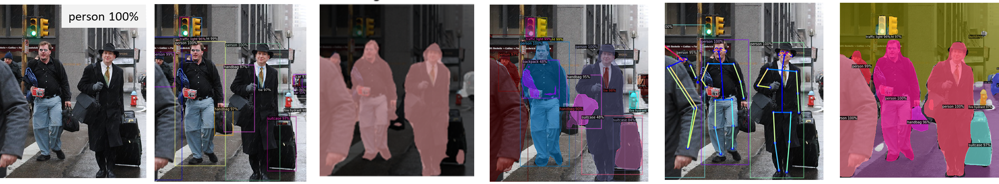

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
Specificity of Semantic Segmentation:<ul>
    <li> The <b>Semantic Segmentation</b> task Could be considered as pixel-wise multiclass classification.
    <li> The output is $C\times W\times H$, <ul> where $C$ is the number of classes (channels); $W\times H$ is the size of each channel. </ul>
    <li> The output could be obtained as <ul>
        <li> expansion of last layer (head parts).
        <li> neck+head layers (like dilated convolution).   
        <li> encoder-decoder architecture.
        <li> combination of approaches.            </ul>
    <li> The loss function could has as <ul>
        <li> geometrical meaning for full objects (intersection of areas);
        <li> geometrical meaning for boarders (specific distance functions);    
        <li> pixel-wise classification (Cross-Entropy). </ul>
    <li> The loss function usually highly imbalanced: <ul>
        <li> objects could have different size;
        <li> background could take up a lot of image space <ul>
            Especially in comparison with each other classes.</ul>


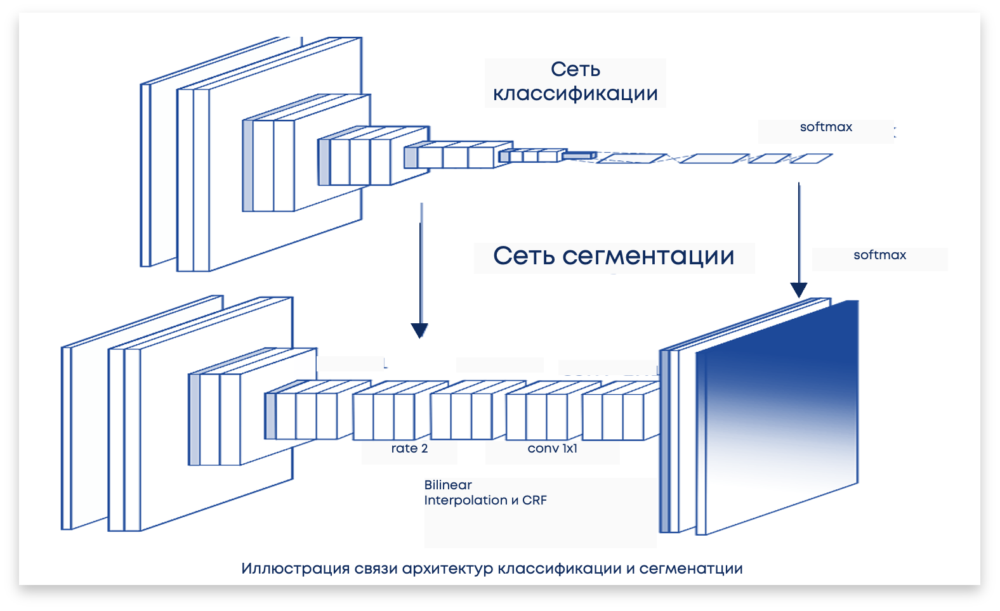

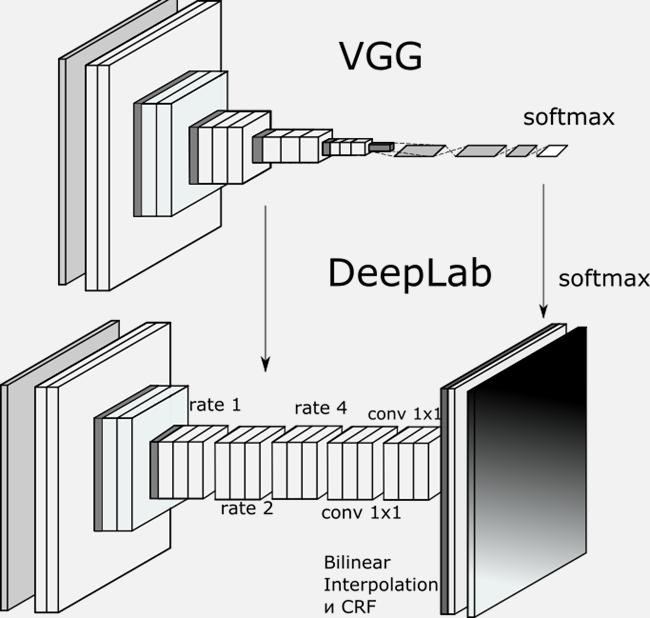

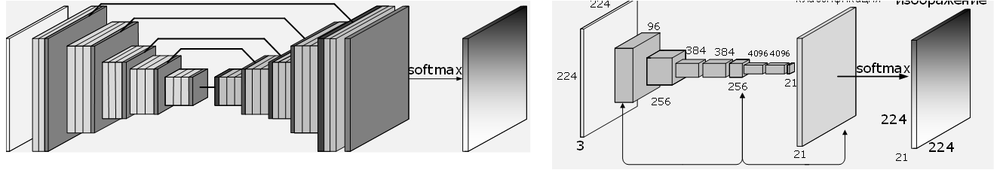

## Loss Function Specificity

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The loss function is the one of the most complex question for optimization in such tasks as Semantic segmentation, instance segmentation and object detection.<br>
<u>Loss function is a method of evaluating how well your models suit for your task and for your data.</u> <br>
The <b>Semantic Segmentation</b> task Could be considered as pixel-wise multiclass classification, thus output is $C\times W\times H$, where $C$ is the number of classes (channels); $W\times H$ is the size of each channel. 


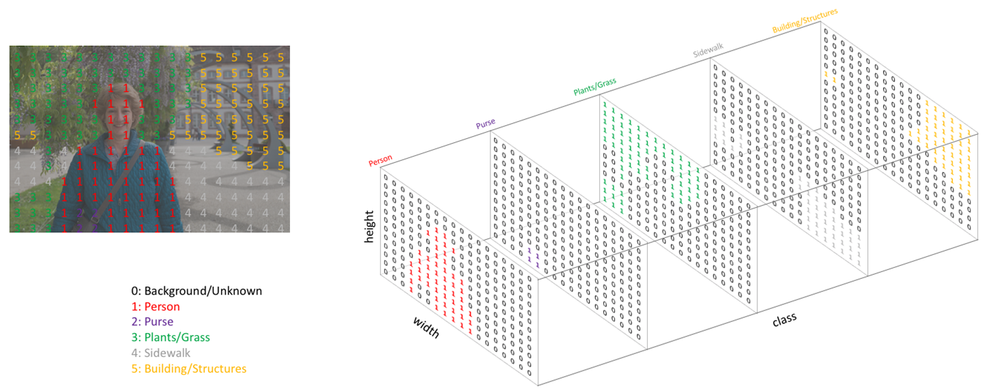
<!-- https://www.jeremyjordan.me/semantic-segmentation/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Segmentation Loss</b><br>
    The Semantic Segmentation task is to label each pixel of an image with a corresponding class of what is being represented.<br>
    For this case the number of segmentation outputs (channels) need to be the same as number of classes.<br>
    In the MultiClass And the probability weighting (for instance, softmax) need to ba taken for ach pixel trough all the channels, 
    $$ softmax(x_{whj})=\frac{\exp(x_{whj})}{\sum_{c=0}^{C-1}\exp(x_{whc})}$$
<em> Notes</em><ul>
    <li>Due to predicting for every pixel in the image, this task is commonly referred to as dense prediction.
    <li>In the Semantic Segmentation  instances of the same class are not separated the things under classification is the category of each pixel. 
     <li> Actually semantic segmentation classes are made as in the one-hot encoding, but each element here is the two-dimension element,
         $$T(y_i) =   \begin{bmatrix}
              instance&class_0&...&class_c&...&class_{C-1}\\
              instance_i&channel_0{W\times H}&...&channel_c{W\times H}&...&channel_{C-1}{W\times H}\\
              \end{bmatrix}$$
    <!-- https://www.jeremyjordan.me/semantic-segmentation/ -->
    <li> For propose of semantic segmentation we can distinguish three groups of loss functions:<ul>
        <li> <b>Cross-Entropy losses</b>, like BCE or categorical CE allow to classify the object as its self $-\log(\hat{y})$;
      <li> <b>Intersection over union</b>, like DICE or Jaccard, allow to classify the small specificity of the shape and position of the object ($dice=2y\cdot\hat{y}/(|y|+|\hat{y}|))$; 
      <li> <b>Boundary loss</b> for edge and contour segmentation, like <b>Hausdorf distance</b> ($ \max_{\hat{y}}\big[\min_{y}(||y-\hat{y}||^2)\big]$). 
          <!-- https://neptune.ai/blog/image-segmentation-in-2020 -->
          <!--     https://www.researchgate.net/publication/342520628_A_survey_of_loss_functions_for_semantic_segmentation -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
The Semantic Segmentation Loss corresponds to the Multiclass Classification. Thus, we can introduce
<li><b>Pixel-Wise Cross Entropy Loss</b><ul>
    $$ L_i=-\sum_{w=0,h=0}^{W-1,H-1}\sum_{c=0}^{C-1}y_{icwh}\log(\hat{y}_{icwh}),$$
    where<ul>
        <li>$\sum_{w=0,h=0}^{W-1,H-1}$ is the sum through the all pixels of 1 channel.
        <li>$\sum_{c=0}^{C-1}$ is the sum through the all classes i.e. all channel. 
        <li>$y_{icwh}$ is the pixel label i.e. ($0,\ 1$). 
        <li>$\hat{y}_{icwh}$ is the output of network.   
        </ul>
   In some cases, different pixels can have different weights. For instance, we can increase the weights for the edge of the object shapes. Here we increase also the penalty of non-correct edge detection.<ul>
    For <b>weighted Pixelwise CrossEntropy Loss</b> we will have
    $$ L_i=-\sum_{w=0,h=0}^{W-1,H-1}\sum_{c=0}^{C-1}w_{cwh}y_{icwh}\log(\hat{y}_{icwh}),$$
    where $w_{cwh}$ is the weight tensor for all pixels in all output channels (classes).</ul>
<!--     https://www.jeremyjordan.me/semantic-segmentation/ -->
   <br> <em>Note</em><ul>
   <li> Beside of using cross entropy, you may use <b>BCELoss</b> for each pixel as:
    $$ L_i=-\sum_{w=0,h=0}^{W-1,H-1}\left(y_{iwh}\log(\hat{y}_{iwh})-(1-y_{iwh})\log(1-\hat{y}_{iwh})\right),$$
    <li> or <b>weighted BCE loss</b> as:
        $$ L_i=-\sum_{w=0,h=0}^{W-1,H-1}\left(w_{wh}y_{iwh}\log(\hat{y}_{iwh})-(1-y_{iwh})\log(1-\hat{y}_{iwh})\right),$$
    <li> It is also can be applied <b>Balanced BCELoss</b>
        $$ L_i=-\sum_{w=0,h=0}^{W-1,H-1}\left(b_{iwh}y_{iwh}\log(\hat{y}_{iwh})-(1-b_{iwh})(1-y_{iwh})\log(1-\hat{y}_{iwh})\right),$$
        where $b_{iwh} = 1-\frac{{y}_{iwh}}{W\cdot H} $
<!--     https://www.researchgate.net/publication/342520628_A_survey_of_loss_functions_for_semantic_segmentation -->

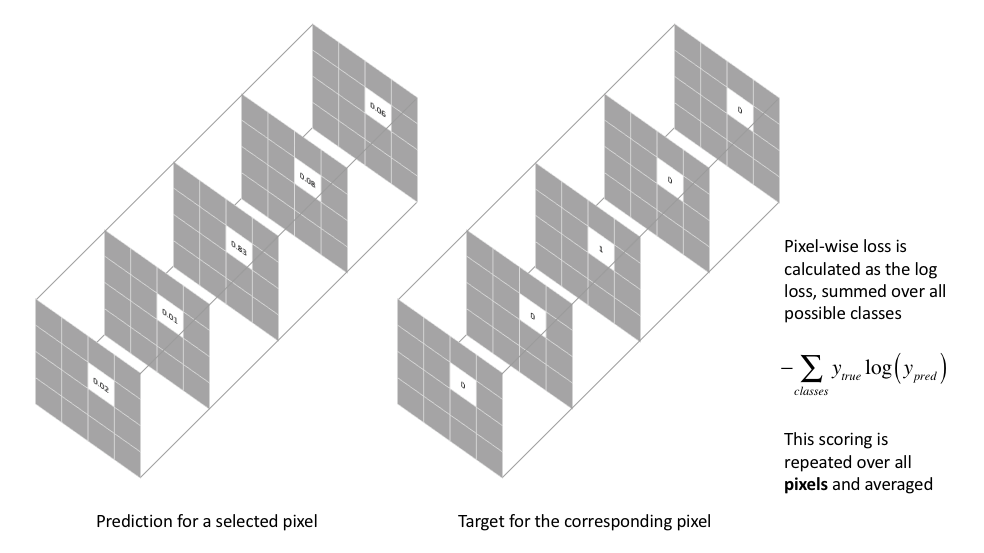

<!-- https://www.jeremyjordan.me/semantic-segmentation/ -->

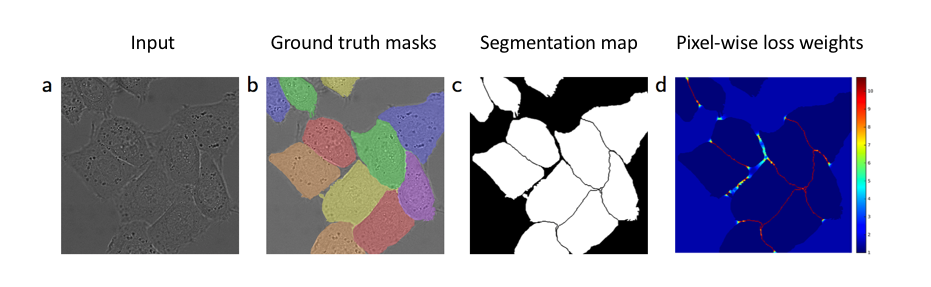
<!-- https://www.jeremyjordan.me/semantic-segmentation/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'> Example of semantic segmentation with weights.

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<li><b>Focal Loss</b><ul>
    The extension for Cross-Entropy Loss can be Focal Loss function - which is actually the variation of Cross-Entropy.<br>
    <u>The advantage Focal Loss that it down-weights the contribution of easy examples and enables the model to focus more on learning hard examples.</u> <br>
    Thus, it, fore instance, works well for highly imbalanced class task.
    $$ L_i=\sum_{c=0}^{C-1}\alpha_c(1-\hat{y}_{ic})^{\gamma_c} CE = -\sum_{c=0}^{C-1}\alpha_c(1-\hat{y}_{ic})^{\gamma_c} y_{ic}\log(\hat{y}_{ic}),$$
    where:<ul>
    <li> $\alpha_c$ is the weight of class $c$, it can be choose as inverse class frequency;
        <li> $\gamma_c $ is the modulation factor to set the penalty to misclassified instances (so-called hard-negative examples).             

<!--     https://www.researchgate.net/publication/342520628_A_survey_of_loss_functions_for_semantic_segmentation -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
For Binary case we can also introduce <b>Binary Focal loss</b>:
            $$ L_i=\alpha(1-\hat{y}_{i})^{\gamma}y_{i}\log(\hat{y}_{i})+(1-\alpha)\hat{y}_{i}^{\gamma}\log(1-\hat{y}_{i}), $$ 
       where:<ul>
       <li> $\alpha$ and $\gamma$  are the coefficients inversely proportional to the is the amount of data in class;
       <li>Positive examples: Target Class or foreground information such as ground-truths.
<li>Negative examples: Non-Target Class or background information such as anchors whose IoU with ground-truths is less than a given threshold.
<li>Easy positives/negatives: Samples classified as positive/negative examples.
<li>Hard positives/negatives: Samples misclassified as negative/positive examples.    
<!--     https://medium.com/visionwizard/understanding-focal-loss-a-quick-read-b914422913e7 -->
            </ul>
<!--             <em>Note</em><ul>
        <li>Hard Examples here are  such as with small ROIs(region of interest).
        <li>Well-classified examples (Easy  examples) need to be down-weighted by $\gamma$.  -->
            <!--     https://www.researchgate.net/publication/342520628_A_survey_of_loss_functions_for_semantic_segmentation -->       
           
  

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
<li><b>Dice Loss (Dice-Serene Coefficient)</b><ul>
    Actually, the main goal of semantic segmentation is to increase the similarity between the target object and the output of the network. The most native way here is trying to increase the <b>Intersection over Union (IoU)</b> between target and predicted objects. <u>This approach allowing to increase as the similarity in position of object as similarity in the shape.</u>  There are exist a several normalized (to range 0-1) measures of IoU, most popular of the is them is the Dice coefficient.
    $$dice_i = \sum_{c=0}^{C-1}\left(1 - 2\frac {y_{ic}\cap \hat{y}_{ic}}{|y_{ic}|+|\hat{y}_{ic}|} \right)= \sum_{c=0}^{C-1}\left(1-2\frac{\text{IoU}}{\text{area}({y}_{ic})+\text{area}(\hat{y}_{ic})}\right),$$
    where $y_{ic}\cap \hat{y}_{ic}$ is the IoU between the class channel and predicted one, for the our use 
    $$ \text{IoU} = y_{ic}\cap \hat{y}_{ic}= \sum_{w=0,h=0}^{W-1,H-1}y_{icwh} \cdot \hat{y}_{icwh} $$
    <!--     https://www.researchgate.net/publication/342520628_A_survey_of_loss_functions_for_semantic_segmentation -->

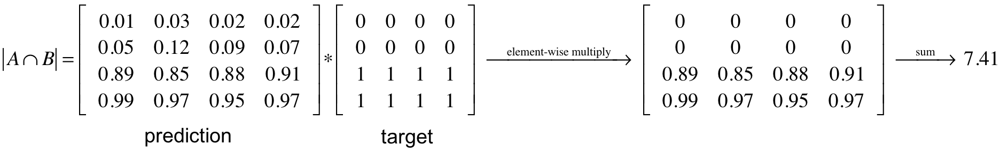

<!-- https://www.jeremyjordan.me/semantic-segmentation/ -->

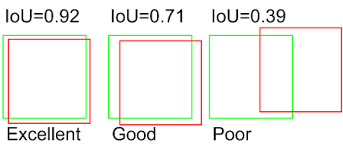

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
    <em>Note</em><ul>
    <li> Some authors separate concepts of dice index 
        $$ \text{dice index} = 2\frac {y_{ic}\cdot \hat{y}_{ic}}{|y_{ic}|+|\hat{y}_{ic}|}$$ 
and dice index (also soft-dice): 
        $$\text{soft dice = dice distance = dice loss} = 1- 2\frac {y_{ic}\cdot \hat{y}_{ic}}{|y_{ic}|+|\hat{y}_{ic}|}.$$
    <li> Actually the more computation effective implementation of Dice is calculated as
         $$dice_i = \sum_{c=0}^{C-1}\left(1 - 2\frac {|y_{ic}\cap \hat{y}_{ic}|+1}{|y_{ic}|+|\hat{y}_{ic}| +1} \right),$$
    <li> In some cases Dice is calculated as
         $$dice_i = \sum_{c=0}^{C-1}\left(1 - 2\frac {|y_{ic}\cap \hat{y}_{ic}|}{|y_{ic}|^2+|\hat{y}_{ic}|^2} \right),$$ 
    <li> Frequently Dice and Cross-Entropy are applied together as:
        $$loss_i = w\cdot dice\_loss_i + (1-w)ce_i, $$
        where $ce_i$ is the cross-entropy loss (or BCE for binary classification); $w$ is the weight of those factors.
    <li>Beside the Dice, in some cases you may see the popular similar loss function, such that:<ul>
    <li> <b>Jaccard coefficient</b>
        $$ jaccard_i = \sum_{c=0}^{C-1}\left(1 - \frac {|y_{ic}\cap \hat{y}_{ic}|}{|y_{ic}|\cup|\hat{y}_{ic}|} \right)= \sum_{c=0}^{C-1}\left(1 - \frac {|y_{ic}\cup \hat{y}_{ic}|}{|y_{ic}|+|\hat{y}_{ic}|-|y_{ic}\cap \hat{y}_{ic}|}\right) $$
<!--         <li> <b>Tversky Loss</b>
            $$ tversky_i = \sum_{w,h}\sum_{c=0}^{C-1}\left(1 -\frac {y_{i}\hat{y}_{i}}{y_{i}\hat{y}_{i}+\beta(1-y_i)\hat{y}_{i} + (1-\beta)y_i(1-\hat{y}_{i}) }  \right),$$
            where:<ul>
            <li>$y_i = y_{icwh}$; $\hat y_i = \hat y_{icwh}$;
                <li> $\beta$ is the coefficient (hyperparameter), for $\beta=1/2$ $tversky_i = dice_i$.</ul>
        <li> <b>Tversky Focal Loss</b>
            $$ fc-tversky_i = \sum_{c=0}^{C-1}\alpha_c(1-tversky_{ic})^{\gamma_c}, $$
            where $tversky_{ic} = \frac {y_{ic}\hat{y}_{ic}}{y_{ic}\hat{y}_{ic}+\beta(1-y_{ic})\hat{y}_{ic} + (1-\beta)y_i(1-\hat{y}_{ic})}$
        </ul>
        <li> <b>Sensitive-Specificity Loss</b><ul>
            Actually, we can classify each pixel in the output as $TP$, $TN$ - true positive or true negative, and $FP$ and $FN$ - alse positive and negative.
       In this case (of binary classification) we can rewrite Dice as $dice = 1- 2TP/(2TP+FP+FN)$, where $TP$ is true positive, $FP$ and $FN$ f Thereby we can introduce generalized measure as:
            $$ ssl_i = b\frac{TP_i}{TP_i+FN_i} + (1-b)\frac{TN_i}{TN_i+FP_i} = b\cdot\text{sensitive}_i + (1-b)\cdot\text{specificity}_i,$$
            where $b$ is the weight of this measure. -->
<!--     https://www.researchgate.net/publication/342520628_A_survey_of_loss_functions_for_semantic_segmentation -->

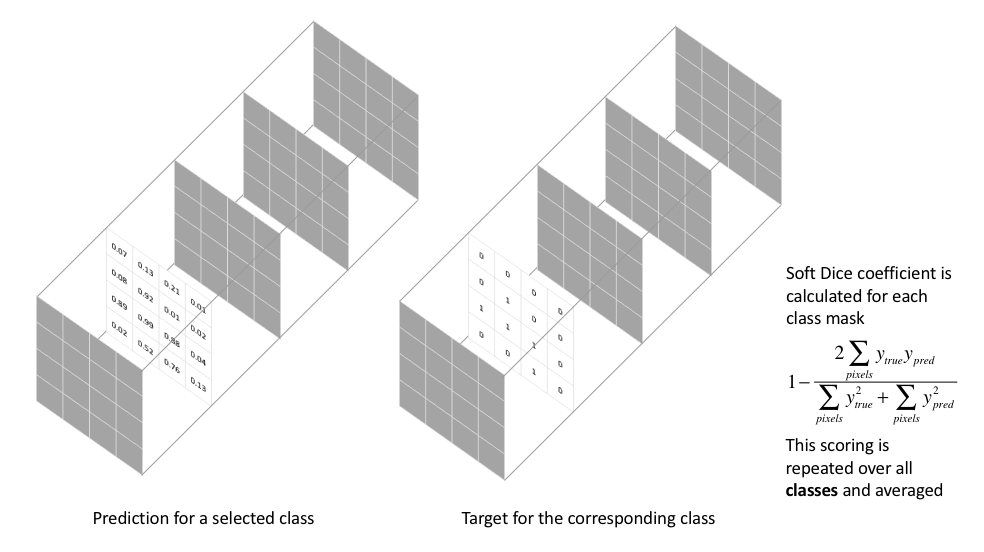

<!-- https://www.jeremyjordan.me/semantic-segmentation/ -->

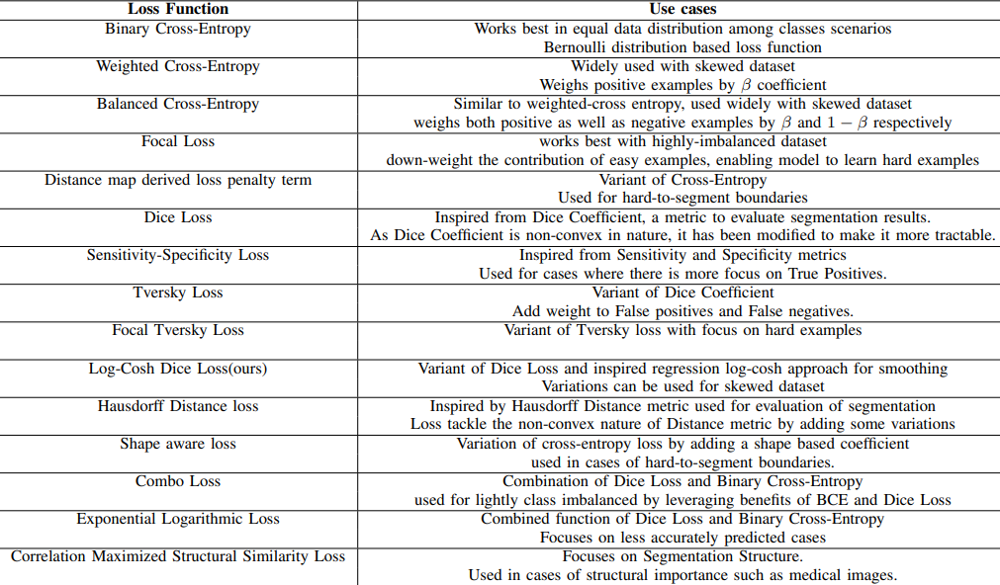
https://arxiv.org/pdf/2006.14822.pdf

## Vanilla Architectures

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>Full Convolutional Network (FCN)</b> <br>
Idea under FCN replacement of the classification head with expansion layer <br>
For the network the feature extractor could be applied from pretrained classification network.<ul>
    The head part is full-convolutional with expansion layer. <br>


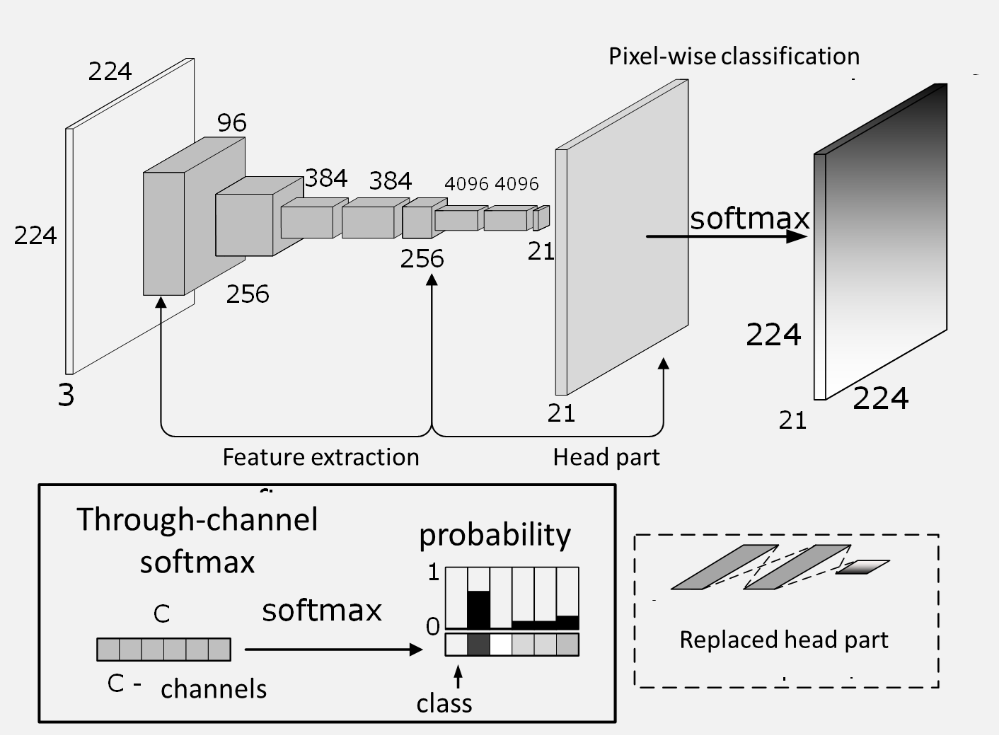

### Upsampling Layer

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
Beside the pooling (or downsampling layer) in some cases it is need to make inverse operation - <b>upsampling</b>. <br>
There are exist a lot of upsamplig techniques. <br>
In the essence Upsampling consists in the task of mapping one input value $\tilde r$ into the region $R$<br> (or its elements $r_{ij}$ such as  $r_{ij}\in R$). 
    
   

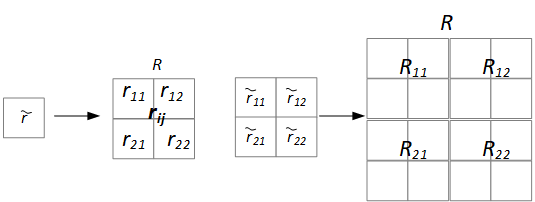

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
The tree main ways to upsampling are:<ul>
    <li> <b>Transposed Convolution </b>;
    <li> <b>High-resolution Convolution</b>;
    <li> <b>pooling up-sampling</b>; 
    <li> <b>Interpolation up-sampling</b> 

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
<b> Interpolation up-sampling</b>.<ul>  
    <li><b>Nearest Neighbors</b> Interpolation - fill full upsampled region with the same values as input.
    $$r_{ij} = \tilde{r} \text{ for }ij\in R, $$
    where:<ul>
        <li>$r_{ij}$ are the output elements of the upsampled region $R$;
        <li> $\tilde{r}$ is the input element, $\tilde{r} \to r_{ij}\in R$;   
      </ul>  
    <li><b>"Bed Of Nails"</b> -  fill only first element of output region with input value. 
    $$r_{ij} = \tilde{r} \text{ if }i = 0  \ \ j=0 \in R; \ \ 0 \text{ otherwise.} $$
    <li><b>Bilinear Interpolation</b> - interpolate values using bilinear equation for 4 nearest points. 
    <li><b>Bicubic Interpolation</b> - interpolate values using bicubick equation for 16 nearest points. 
    <li><b>Low-pass filtration Interpolation</b> (<b>Lanczos interpolation</b>)- interpolate using "Bed Of Nails" and Low-Pass filtration.         
   
<!-- https://medium.com/jun-devpblog/dl-12-unsampling-unpooling-and-transpose-convolution-831dc53687ce -->
<!--     https://towardsdatascience.com/transposed-convolution-demystified-84ca81b4baba -->
    

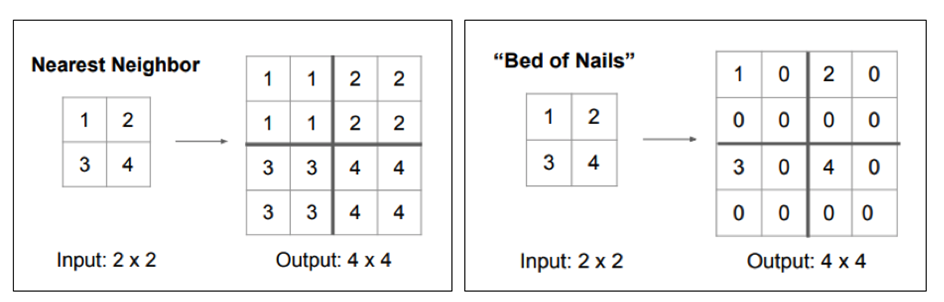

<!-- https://www.jeremyjordan.me/semantic-segmentation/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
The <b>Bilinear Interpolation</b> is the most popular way for upsampling.

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
For understanding the bi-linear Interpolation let's first considering the linear case  

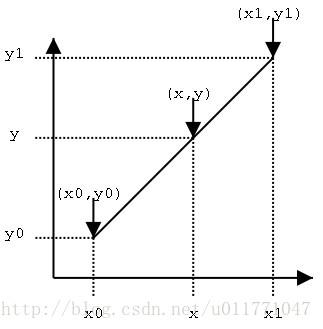

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
The bilinear case is the 2-dimensional interpolation:<ul>
    The idea is to obtain new value as linear interpolation of the <br>
    points values which we have. <ul>
    <li> Represent region as 2d plot.
    <li> use linear interpolation for edge horizontal axis.  
    <li> use linear interpolation for edge vertical axis. 
    <li> use linear interpolation  for intermediate values using obtained vertical values.     

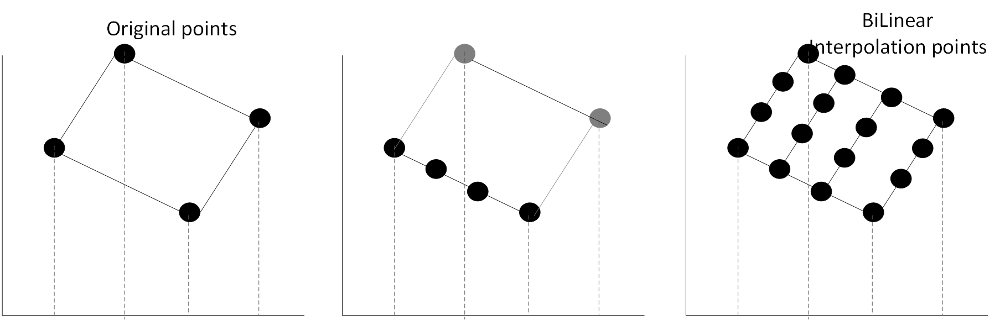
    



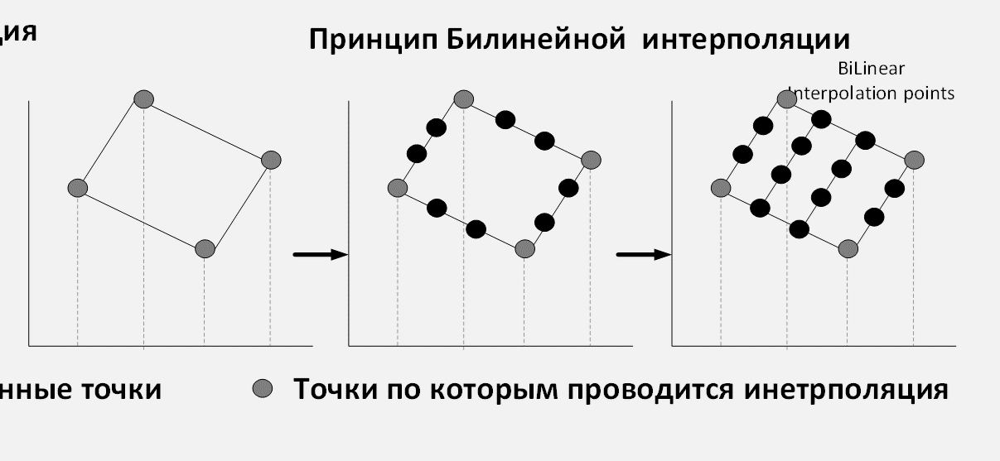

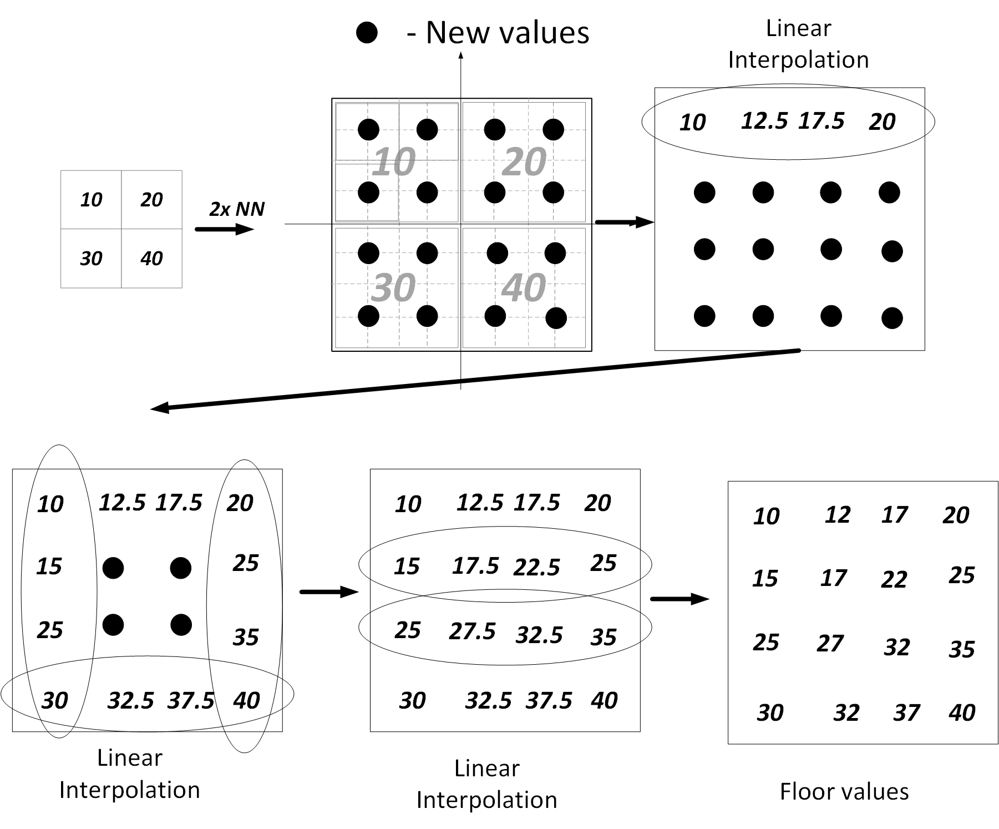

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
The Bilinear interpolation can be obtained analytically:
$$
\begin{aligned}
    &\text{for New point P=(x,y) and : }  \\
    &\text{Old values points: } \\ \\
        &\begin{matrix}
            Q_{11}=(x_1,y_1) & Q_{12}=(x_{2},y_1) \\
            Q_{21}=(x_2,y_1) & Q_{22}=(x_{2},y_2)
        \end{matrix}\\ \\
     &\text{calculate new value: } f(P) \\ \\    
    &f(R_1) = \frac{x_2-x}{x_2-x_1}f(Q_{11})+\frac{x-x_1}{x_2-x_1}f(Q_{21})\\ \\
    &f(R_2) = \frac{x_2-x}{x_2-x_1}f(Q_{12})+\frac{x-x_1}{x_2-x_1}f(Q_{22})\\ \\
    &f(P) = \frac{y_2-x}{y_2-y_1}f(R_{1})+\frac{y-y_1}{y_2-y_1}f(R_{2})\\ \\
\end{aligned}
$$
   
where: $R_1$, $R_2$ auxiliary points.
    

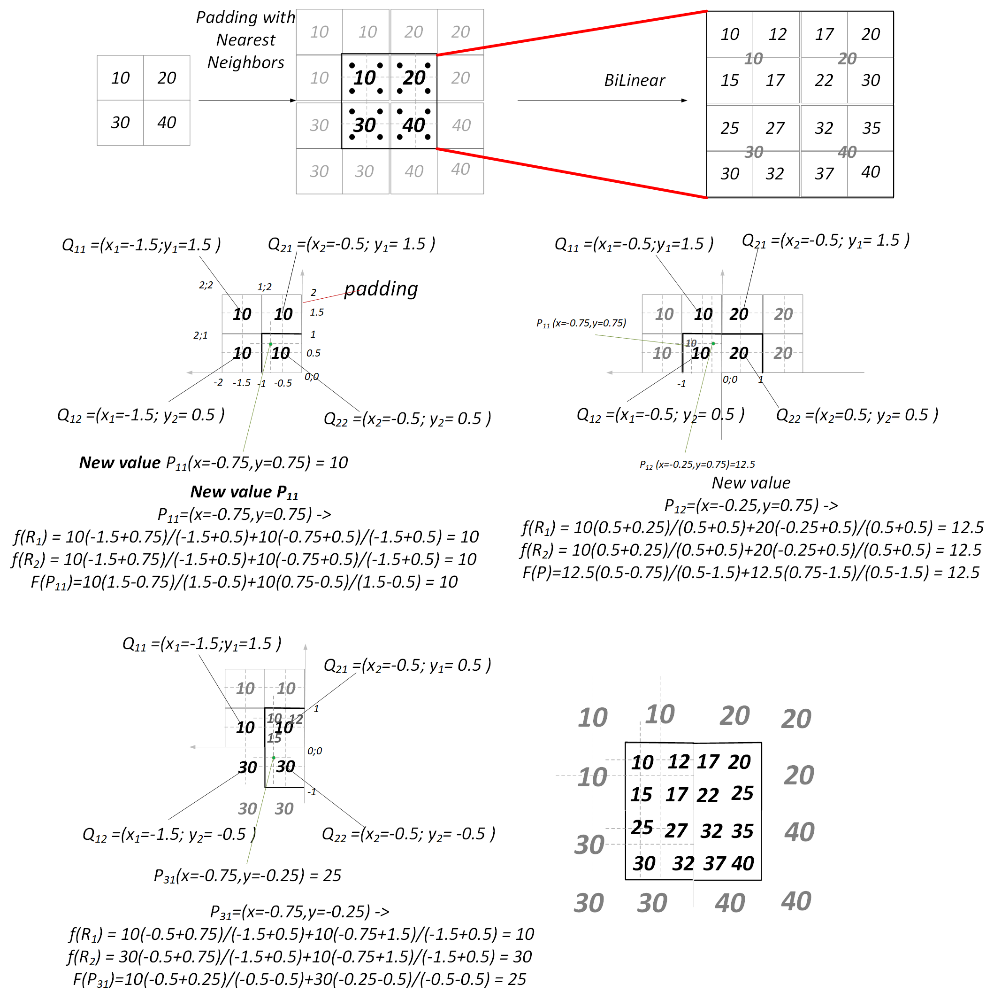

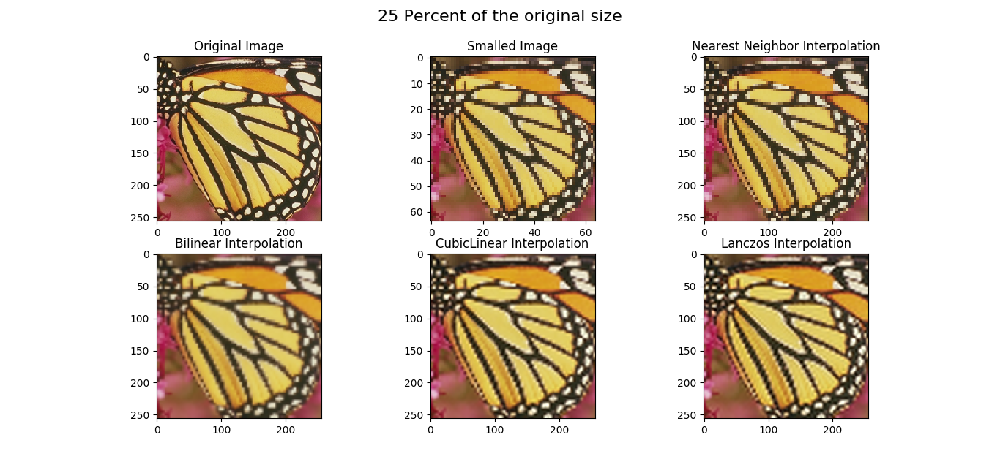
<!-- https://github.com/YasinEnigma/Image_Interpolation -->


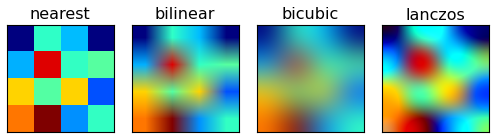
<!-- https://github.com/pytorch/pytorch/issues/25039 -->

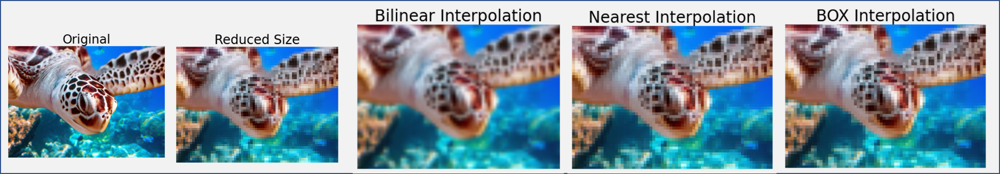

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px'>
The reverse to the convolution operation is the <b>Transposed Convolution</b>.<ul>
The transposed convolution is also called <b>de-convolution</b> or <b>Fractionally Strided Convolutions</b>.<br>
The transposed convolution is widely using in many application, starting from:<ul>
    <li> backward propagation in CNN model training.
    <li> reverse convolution (de-convolution) in segmentation learning (and auto-encoders).
    <li> up-sampling technique.    
    </ul>
For the first let's re-write <b>straight convolution</b> in matrix form 
    $$\text{straight convolution: }r = k\ast x = \boldsymbol{k}\cdot \vec{x},$$ 
Then we can reconstruct the input by <b>pseudo-inverse matrix operation as:</b>
    $$\text{pseudo-inverse convolution: } \vec{x} = \frac{\boldsymbol{k^T}\cdot r}{\boldsymbol{k}\cdot \boldsymbol{k^T}} $$
However, in fact we do not need to take denominator due to our reason is to increase the dimension.<br>
So the <b>transposed convolution</b> can be given as:
    $$\text{transposed convolution: } \vec{x} = \boldsymbol{k^T}\cdot r $$

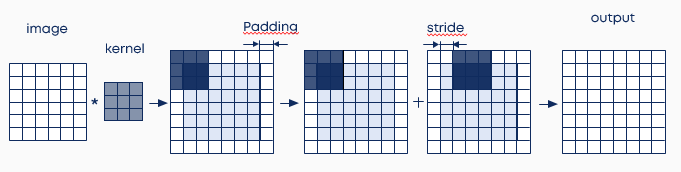

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
<table style="width:100%; table-layout:fixed;">
    <caption style='color:black; font-size:large; text-align: center'>Transposed convolutions</caption>  
  <tr>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/no_padding_no_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/arbitrary_padding_no_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/same_padding_no_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/full_padding_no_strides_transposed.gif"></td>
  </tr>
  <tr>
    <td style='color:black; font-size:large; text-align: center'>No padding, no strides</td>
    <td style='color:black; font-size:large; text-align: center'>Arbitrary padding, no strides</td>
    <td style='color:black; font-size:large; text-align: center'>Half padding, no strides</td>
    <td style='color:black; font-size:large; text-align: center'>Full padding, no strides</td>
  </tr>
  <tr>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/no_padding_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_transposed.gif"></td>
    <td><img width="150px" src="https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd_transposed.gif"></td>
    <td></td>
  </tr>
  <tr>
    <td style='color:black; font-size:large; text-align: center'>No padding, strides</td>
    <td style='color:black; font-size:large; text-align: center'>Padding, strides</td>
    <td style='color:black; font-size:large; text-align: center'>Padding, strides (odd)</td>
    <td></td>
  </tr>
</table>


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>    
>*Note* In the case of padding or striding the input image should be transformed to the expected one by adding zeros element (white in the figures above).

unpooling

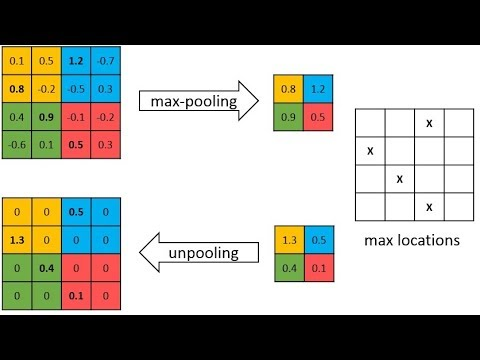

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:3px'>    
<b>Pixel-shuffle (high resolution) convolution</b> (for instance, $\text{shuffle}[9\cdot 3\times 1\times C]$).
    <ul> The main idea is to increase output dimension by shuffling feature extracted by several 2d-kernels.</ul>
<div>
<!--     <img src="attachment:image.png" width="600"> -->
    </div>
<!-- ![image.png](attachment:image.png)     -->

<div>
    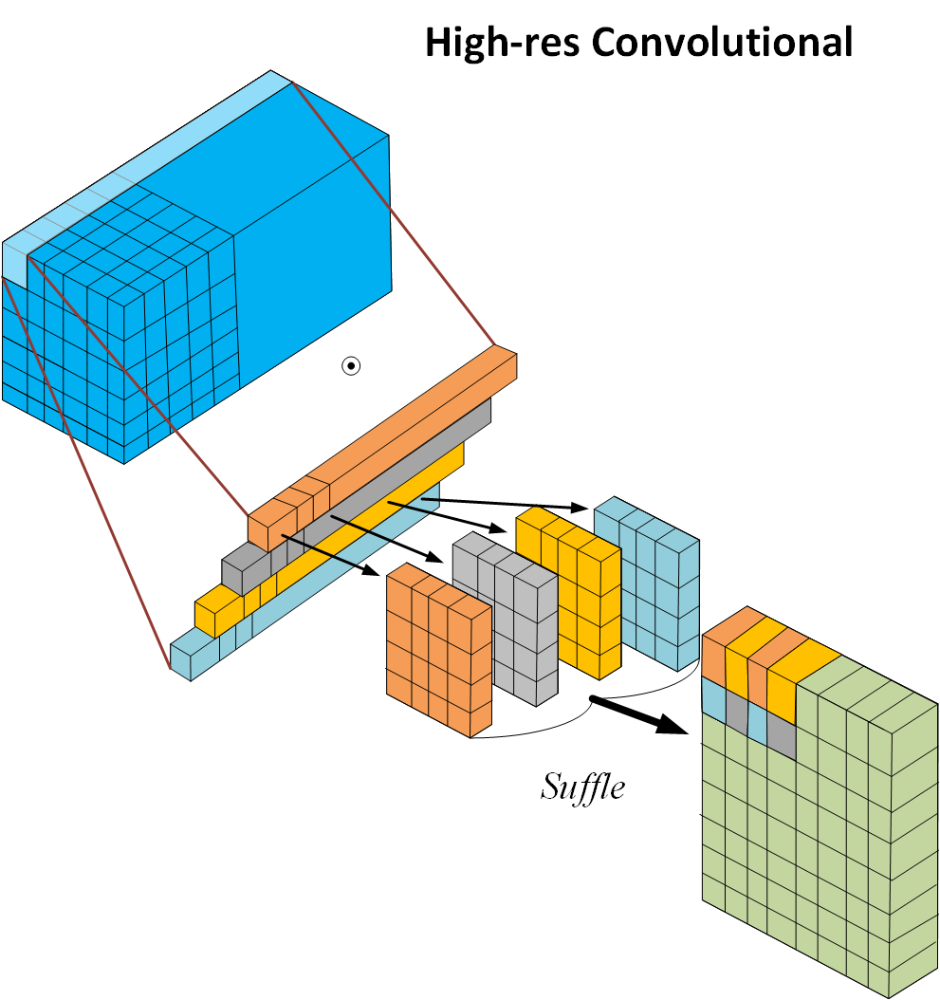
    </div>
    <!-- 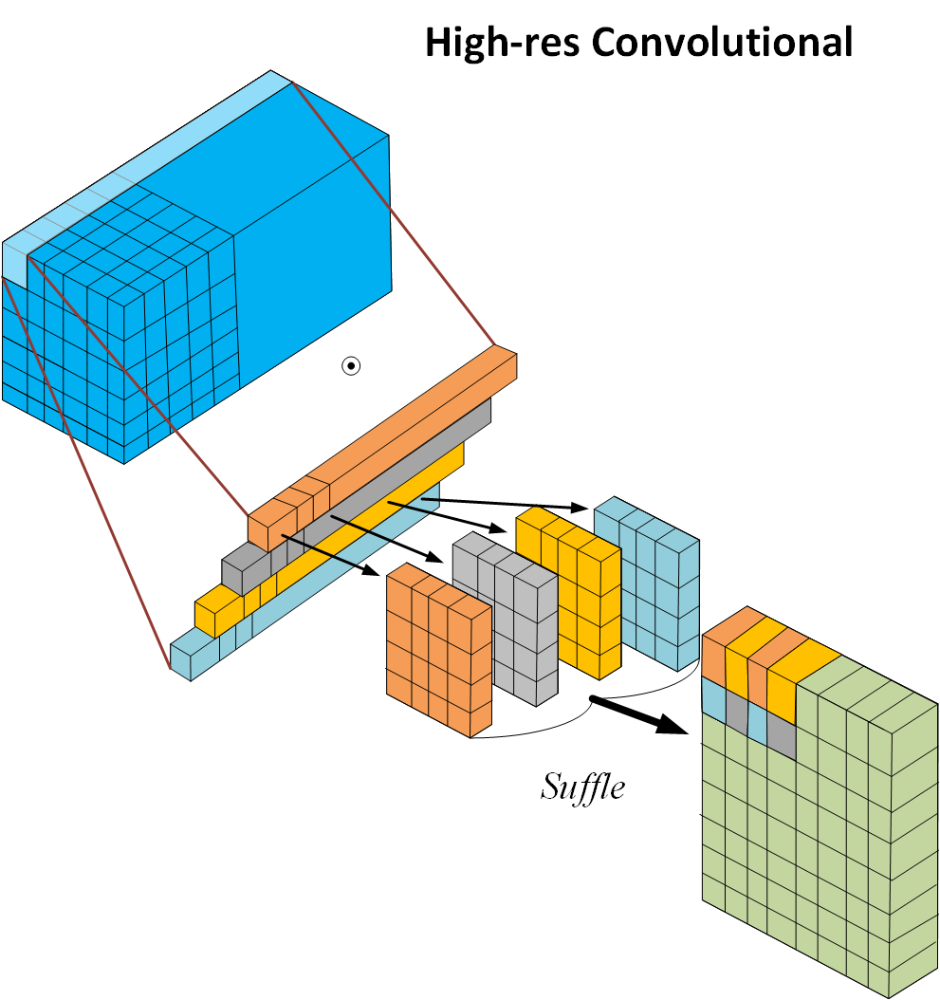 -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
Some explanation of pixel shuffle.
<br> In fact your need to take point-wise convolution first for extract $N=C\times C$ number of channels (for image or feature map with $W\times H\times C$ dimension).
<br> From these $1,2,3,…, N$ outputs of point-conv, where $N$ is $CxC$, take one pixel at a time from each consecutive layer from $1,2  \text{ to } N$ and then shuffle them to get the output.
    
![](https://miro.medium.com/max/600/1*A6i6__d2OMJOJStUQffrkw.gif)

<div>
    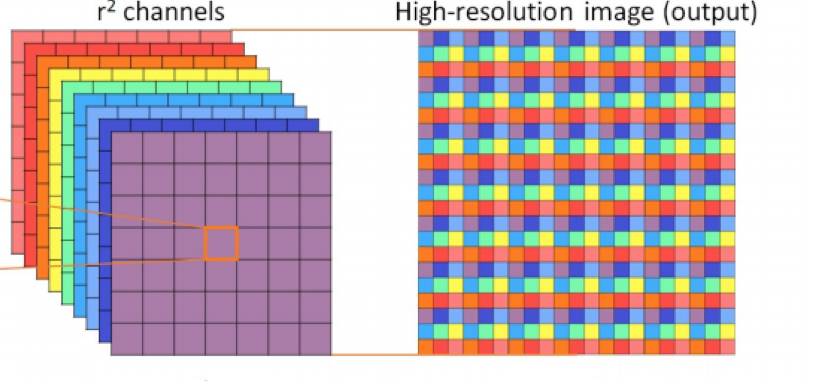
    </div>


<!-- 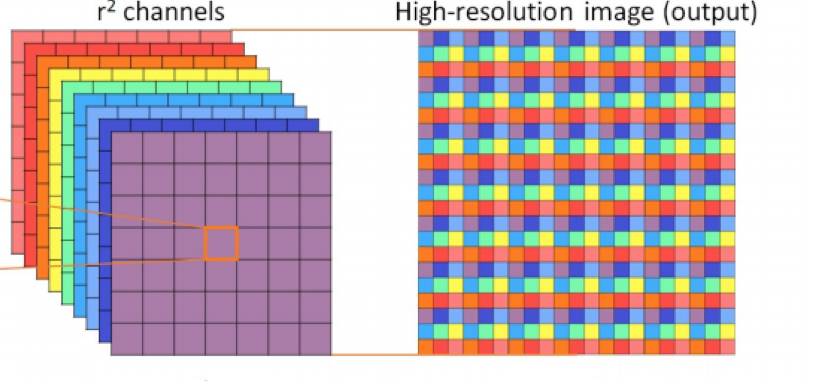 -->

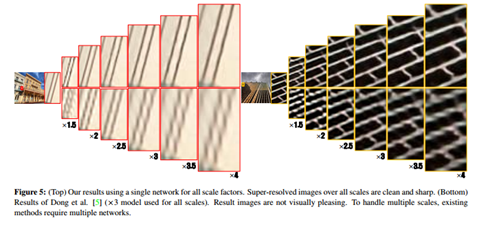

## Encoder-Decoder Architectures

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>DeconvNet</b><br>
    The main idea using approach encoder-decoder for sequencial encoding and decoding.<br>
    for decoder part transposed convolution <br>    
    The aim of encoder is extraction of relevant feature in the latent space( at the end of encoder)<br>
    The aim of decoder is reconstruction of output from latent space like for aoutencoder but with different structure of output and different loss.<br>
    Here output is the so-called mask of class (either silhouette or contour).


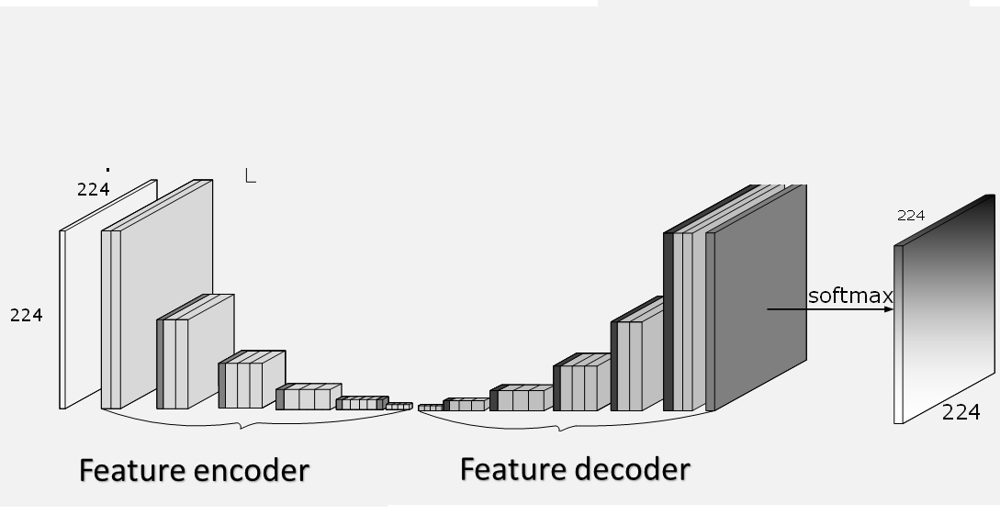

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
Specificity of decoder:<ul>
<li>  Transposed Convolution
<li> unpooling layers </li>

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>SegNet</b><br>
    The basic idea is that the segmentation decoder can work better if it will use unpooling with information about positions of encoder pooling.<ul>
    <em>i.e.</em> unpooling works like backward pooling </ul>
    The explanation: pooling layer lead to lose of some information which could be neglectable in the classification task, but need to be taken in segmentation one. Especially, it is fair for very-small objects.
    

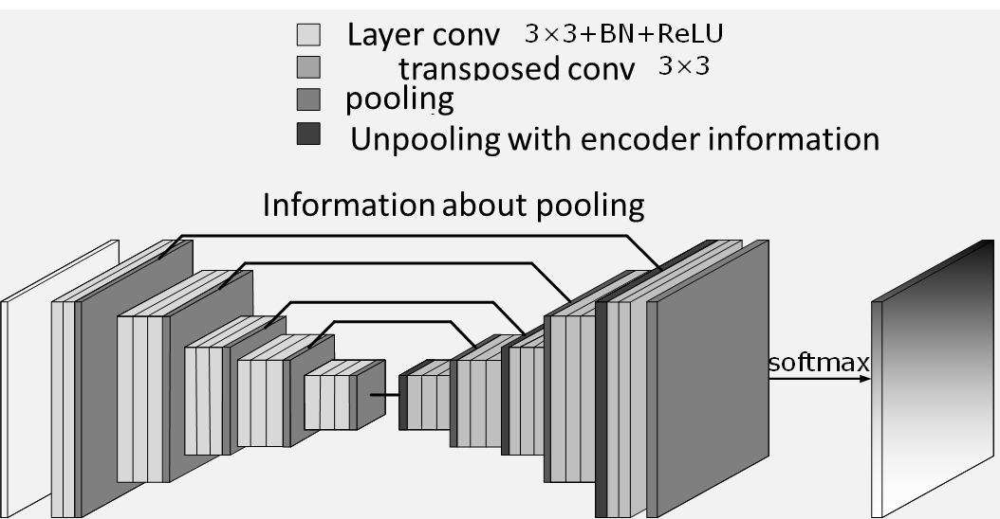

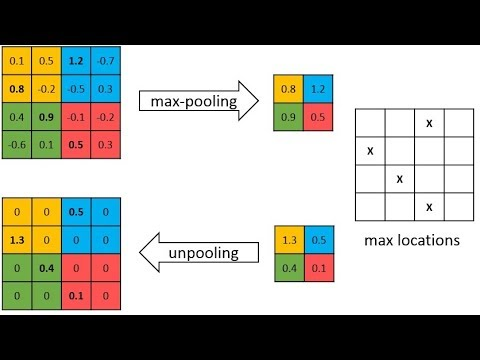

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>U-Net (2015)</b><br>
    The main idea is to tranfer not only pooling information, but all feature maps from the encoder to decoder part.<br>
    This tricks allows to dramatically increase the information during the decoding.<ul>
    for transfer concatination operation is frequency applied.</ul>
    This tricks allow to dramatically increase the accuracy, especially for small objects and their details (like roughness of the edge).<br>
    Firstly U-net was proposed to medical tasks, but now this is the most popular network for semantic segmentation.<br>
    There are exist a lot of other architectures based on the u-net.



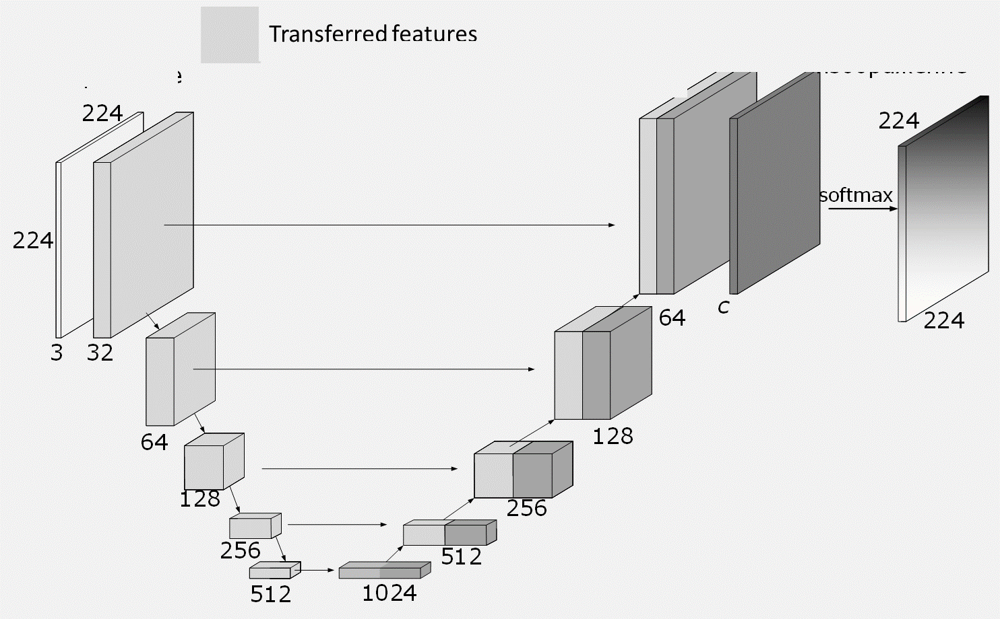

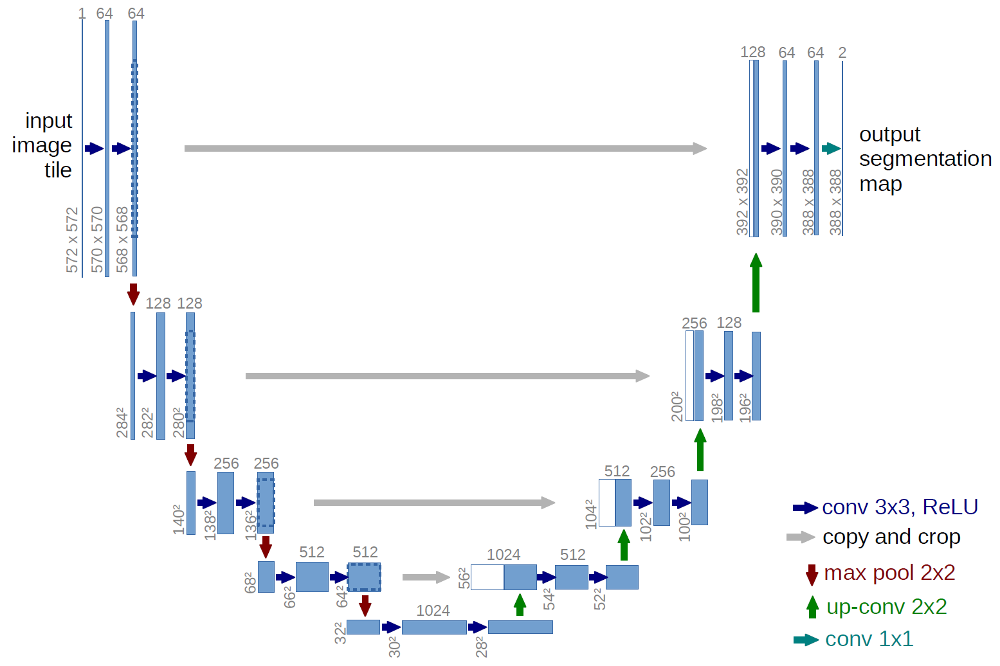


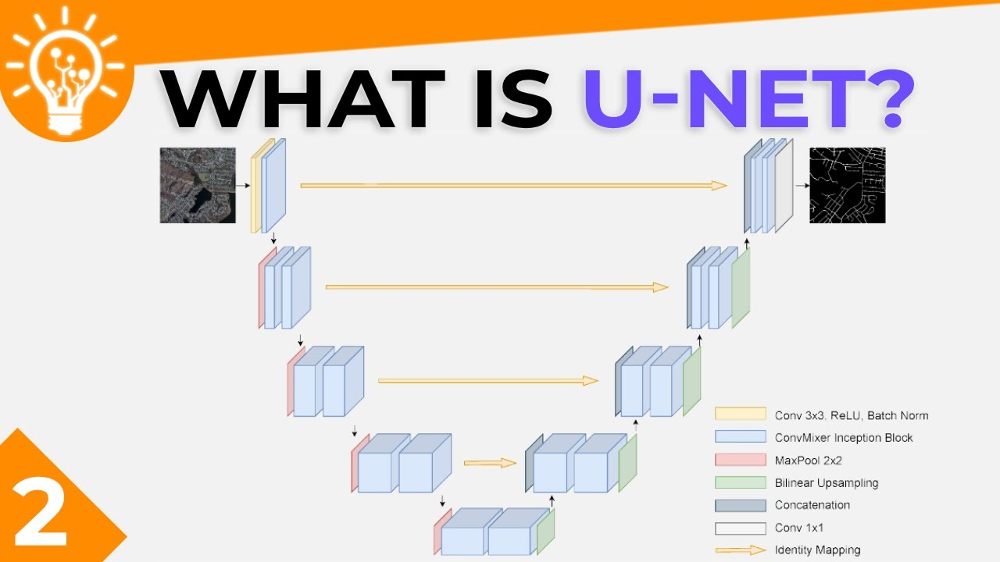

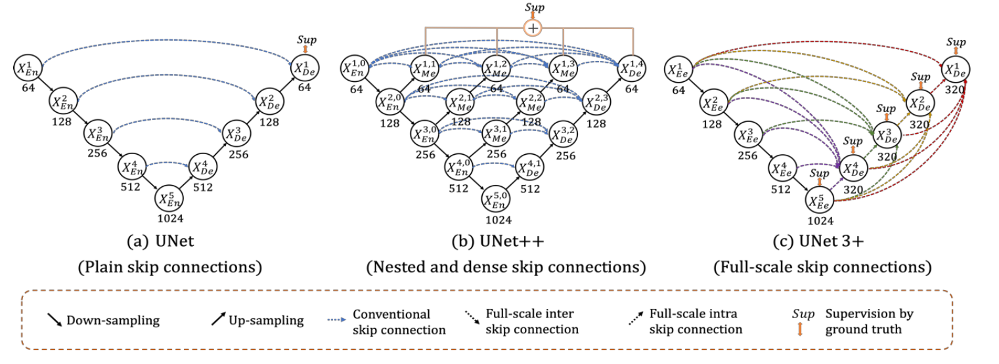

## Dilation Neck Networks

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>Dilated Convolution</b><br>
    The one of the segmentation architecture problem: then more layers with pooling it has then more it loose it space resolution.<ul>
    But, we want to increase receptive field with minimizing the number of architecture parameters.</ul>
    The solution is to replace pooling with an dialed convolution operation.    
$$𝑟(𝑖,𝑗)= (𝑘∗𝑥)(𝑖,𝑗)= \frac{1}{𝑊\cdot𝐻} \sum_{w=0}^{𝑊_𝐺−1}\sum_{h=0}^{𝐻_𝐺−1}𝑘(ℎ,𝑤)𝑥(𝑖+𝑙_ℎ,𝑗+𝑙_𝑤),$$
    $𝑙$ – dilation rate


<img src="https://i.stack.imgur.com/QMs29.png">

<img src="https://www.researchgate.net/publication/336002670/figure/fig1/AS:806667134455815@1569335840531/An-illustration-of-the-receptive-field-for-one-dilated-convolution-with-different_W640.jpg">

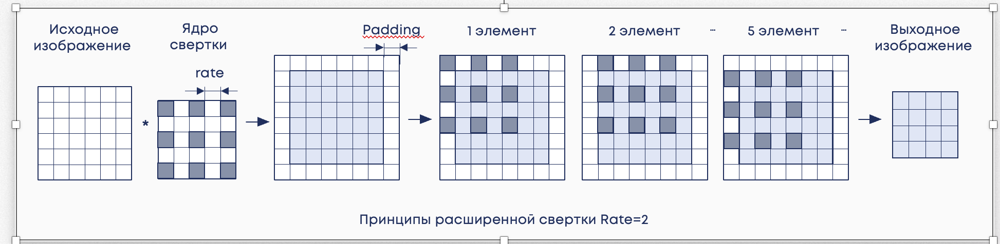

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    The dilation rate works as large kernel + maxpooling.


<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
Thus dilation convolution allows to increase the receptive field without lose of information <br>
    traditionally dilation is applied in sequential way with increasing of dilation rate. <ul>
    Some authors proposed to call that atorus convolution.</ul>
    The authors proposed to call this concept: The large Filed of View (large FOV). <br>
    The addition idea here is to take into account different context of image feature.

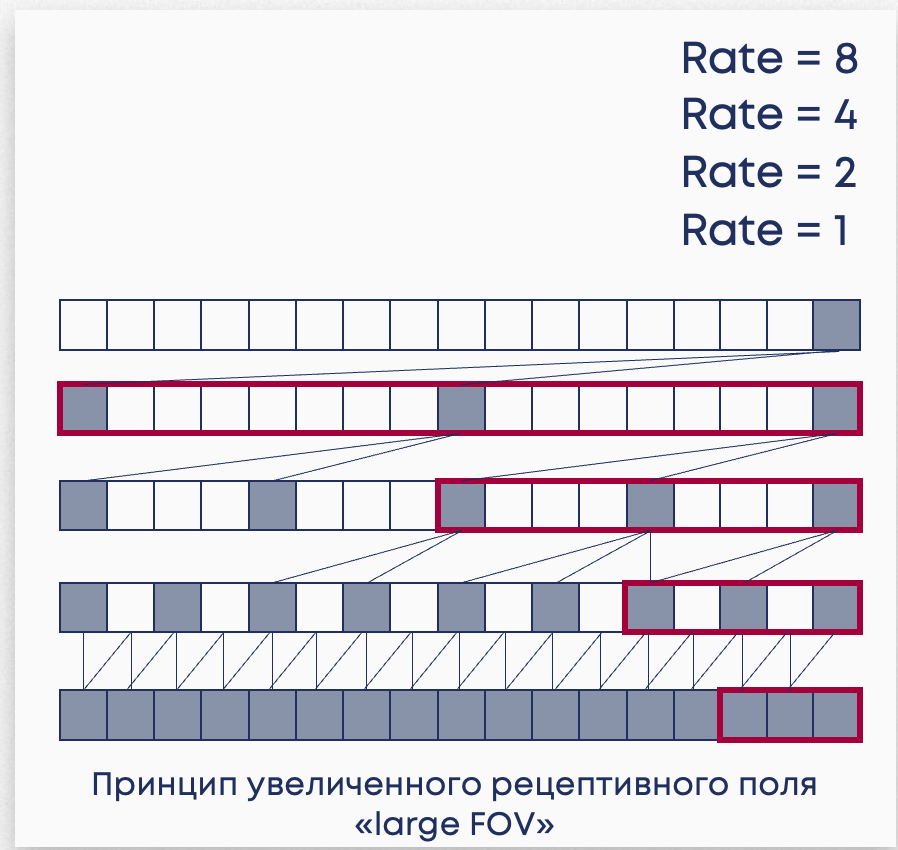

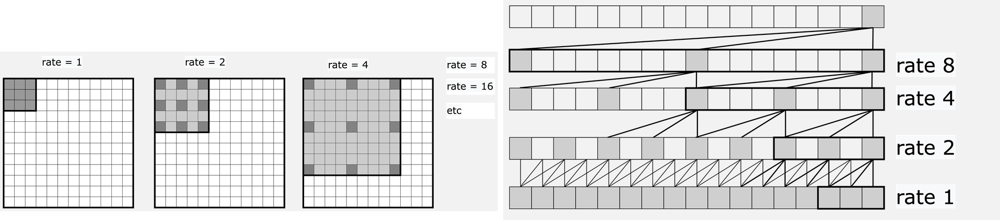

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>DeepLab</b><br>
    The architecture is the first success of using dilated conv in CNN.<br>
    The network is based on the VGG net and FCN Net, but the last feature encoder layers and head part replaced with dilated convolutions (atorus convolution).<br>
    The last layer use bilinear interpolation to obtain the feature map of the output size.<ul>
    It also could exist variants of DeepLab V1 where feature maps of different size are joined before interpolation.</ul>
    After interpolation the boarders of each class are clarified by analogue of iterative bilateral filter - conditional random field (CFR), here is applied pairwise CFR - DenseCFR.<br>
  


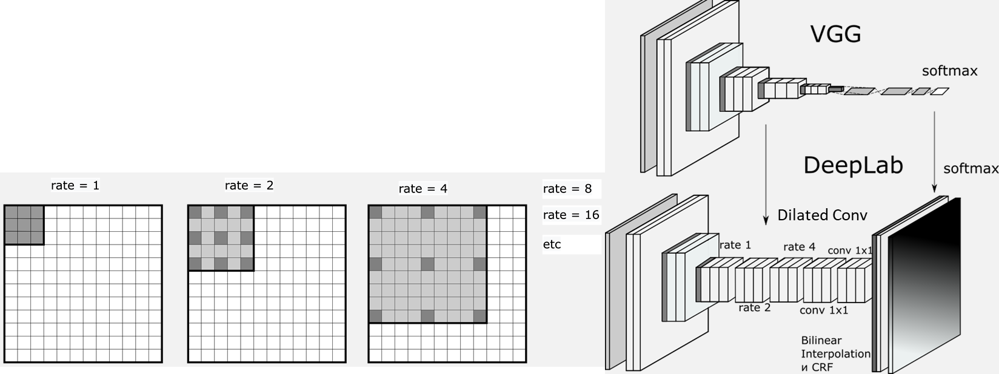

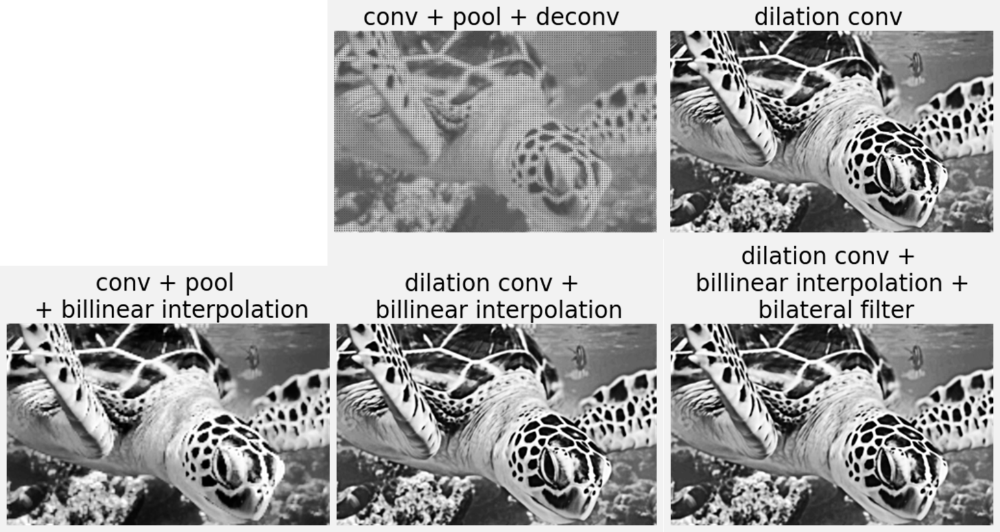

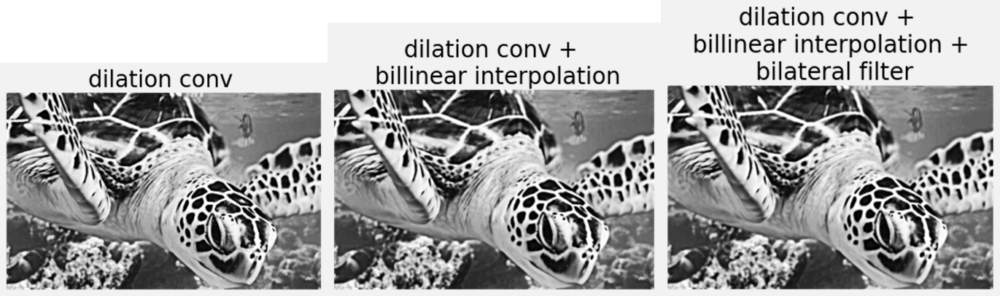

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>DeepLab V2</b><br>
   The main idea is to replacement of sequential Atorus convolutions  with parallel Atorus Spatial Pyramidal Pooling (ASPP). <ul>
    In sequence to each ASPP way $1\times1$ conv is added to shuffle channels if it is necessary. </ul>
    The principle under ASSP is join together features in different scales to take into account different scales of context. <ul>
    ASPP is modification of common  spatial pyramidal pooling (SPP) which is widely known in semantic segmentation and object detection for searching objects of different scales in in different environment.  


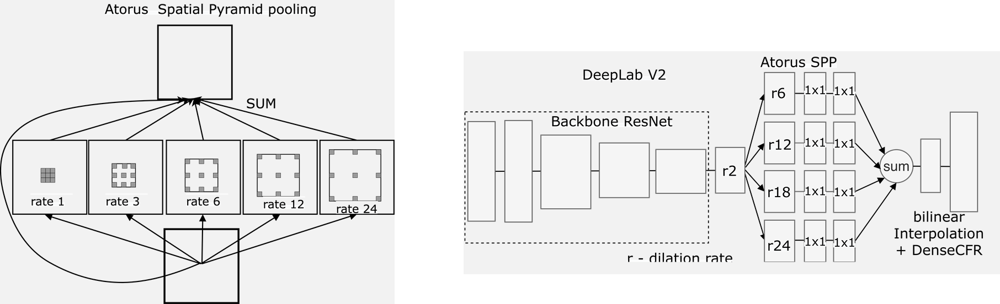

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <blockquote>
    An other implementation of SPP Idea is <b>Pyramid Scene Parsing Network (PSPNet)</b>, which apply Global average pooling with different output for implementing SPP. For each variant of GAP pointwise convolution and BatchNorm is added. For addition skip connection and concatination is applied.
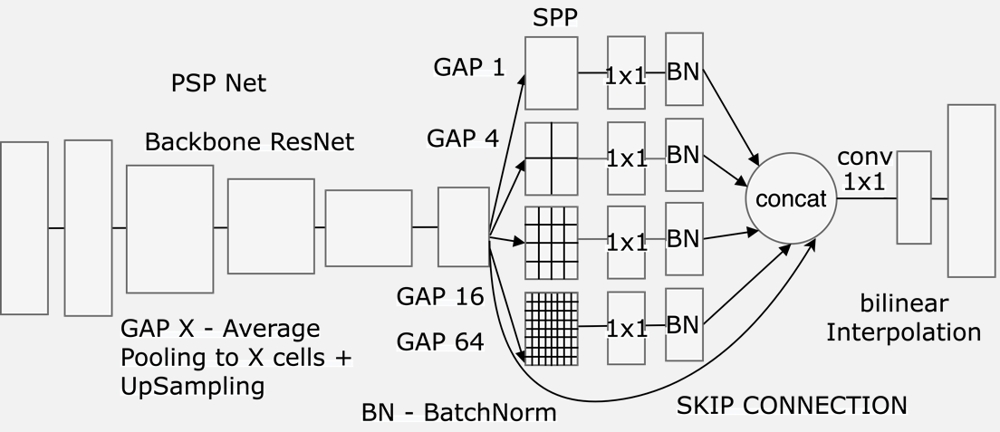

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>DeepLab V3</b><br>
The network join PSPNet with DeepLab V2 - new version of ASPP with balance of classical and dilated convolutions.<br>
    The main idea: increasing of the field of view leads to the increasing of context accounting, but for accurate estimation of some features the small FOV (i.e. receptive field) is required. <ul>
    Thus, ASSP includes as $1\times1$conv as GAP part.<br>
    GAP + UNPooling =  image pooling - idea of taking whole image context into account. <br>
    ASSP includes BatchNormalization, and replace sun with concatenation </ul>
The network does not use CFR, <br>
    backbone based on the ResNet 101.



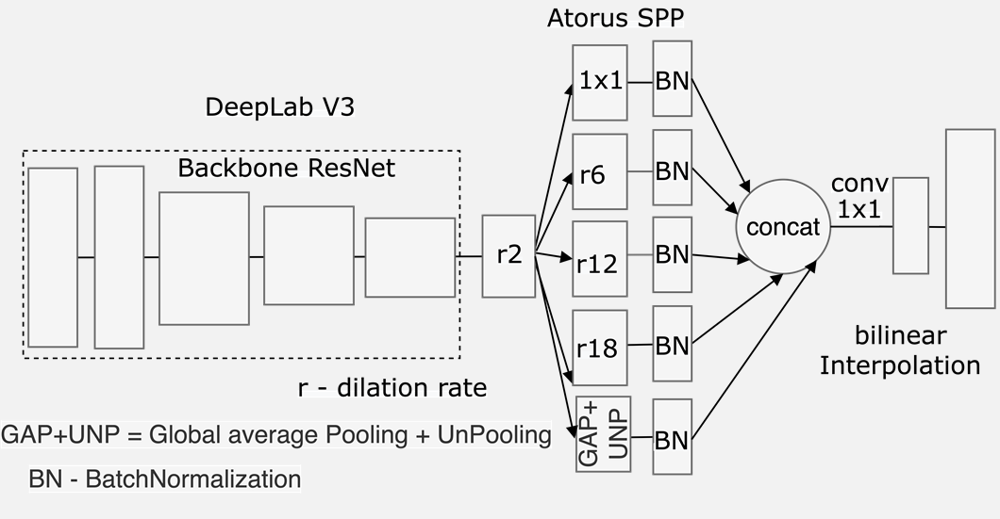

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:3px'>
    <b>DeepLab 3+</b><br>
    The main Idea is to merge encoder-decoder approach with dilated one.<ul>
    <li>The Encoder-decoder U-Net-like approach is better suit for local features - thus increase the border contrasting (better keep semantic information).
    <li> The dilated ASPP convolutions is more robust for different context scale (better for context accounting).</ul>
    Authors proposed to use Atrous Separable Spatial Pyramid Pooling (ASSPP)- the idea of using DepthWise Separable Convolution 
    (DWConv + 1×1 conv) into ASPP.<ul>
    This allows to dramatically decrease computational complexity.</ul>
BackBone – the modified xception network with replacement of part of the maxpooling layer for DepthWise-separable convolution with stride 2.



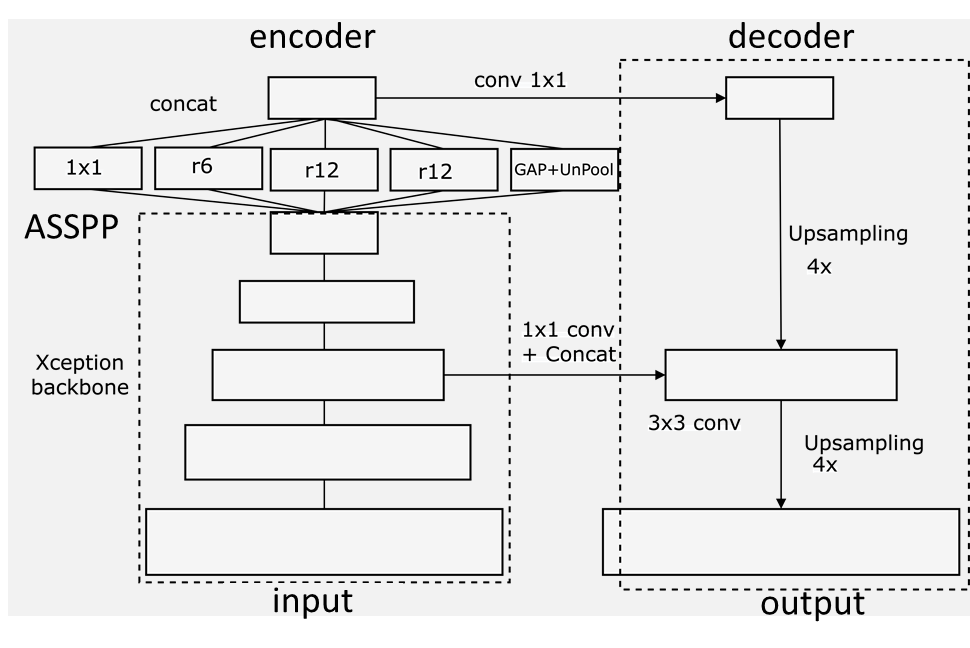

Segnet

<img src="https://production-media.paperswithcode.com/methods/c84b18b5-4329-49fc-a5f2-804ef580a966.png">